## Basical settings

(Copied from the last file)

Import packages

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.modeling import models
from astropy.modeling import functional_models
from astropy import units as u
import os, json, random, cv2
from PIL import Image
from numpyencoder import NumpyEncoder
import multiprocessing
import time
import torch
import torchvision
import detectron2
""
import utils

# for testing purpose
import importlib
importlib.reload(utils)

plt.rcParams["figure.figsize"] = (15,10)
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
!nvidia-smi
print(torch.__version__)
print(torchvision.__version__)
print(detectron2.__version__)
print(torch.cuda.is_available())

Mon Mar  6 15:57:15 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.89.02    Driver Version: 528.49       CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ...  On   | 00000000:0A:00.0  On |                  N/A |
| 48%   61C    P3    51W / 350W |   1033MiB / 12288MiB |     16%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Global variables

In [3]:
wavelengths = np.arange(400, 800)*u.nm
FWHM        = 0.5
lambda_Na   = 589.0*u.nm
lambda_Mg   = 518.3*u.nm
width       = 1000
height      = 1500

dir='./dataset/'
os.makedirs(dir, exist_ok=True)

## Register data

Try to read the dataset we have just generated and confirm that the data is correctly loaded and labelled 

In [4]:
from detectron2.data import DatasetCatalog
from detectron2.data import MetadataCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.utils.visualizer import Visualizer
import detectron2.solver as solver
import detectron2.modeling as modeler
import detectron2.data as data
from detectron2.engine import DefaultTrainer, SimpleTrainer
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.utils import comm

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
from astropy.modeling import models
from astropy.modeling import functional_models
from astropy import units as u
import os, json, random, cv2, gc
from PIL import Image
from numpyencoder import NumpyEncoder

In [5]:
dir='./dataset/'

register_coco_instances('fake_meteors', {}, os.path.join(dir, 'labels.json'), dir)
MetadataCatalog.get("fake_meteors").keypoint_names = ['1', '2', '3', '4']
MetadataCatalog.get("fake_meteors").keypoint_flip_map = ()
# del MetadataCatalog.get("fake_meteors").keypoint_connection_rules
MetadataCatalog.get("fake_meteors").keypoint_connection_rules=[('1', '2', (102, 204, 255)), ('3', '4', (255, 195, 77))]

To see if we have loaded the correct dataset

(1000, 1500, 3)


1000

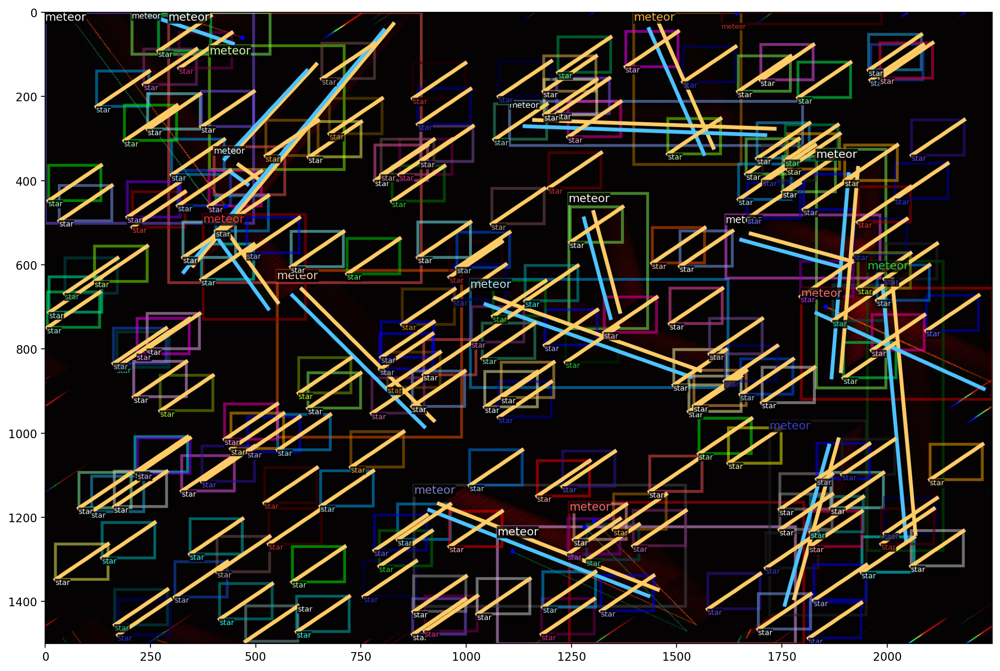

In [6]:
dataset_dicts = DatasetCatalog.get('fake_meteors')
metadata = MetadataCatalog.get('fake_meteors')

for d in random.sample(dataset_dicts, 1):
    img = plt.imread(d["file_name"])
    print(img.shape)
    visualizer = Visualizer(img[:, :, ::-1], metadata=metadata, scale=1.5)
    out = visualizer.draw_dataset_dict(d)
    plt.figure(figsize=[15, 10])
    plt.imshow(out.get_image()[:, :, ::-1])

len(dataset_dicts)

## Train

Using `R50-FPN 3x` model in `COCO Person Keypoint Detection Baselines with Keypoint R-CNN` 

Configuration reference: [https://detectron2.readthedocs.io/en/latest/modules/config.html](https://detectron2.readthedocs.io/en/latest/modules/config.html)

In [7]:
from detectron2.engine import DefaultTrainer
from detectron2 import model_zoo
from detectron2.config import get_cfg

out_dir = './output/'
os.makedirs(out_dir, exist_ok=True)

cfg = get_cfg()

cfg.OUTPUT_DIR = out_dir
cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("fake_meteors",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 1
cfg.SOLVER.IMS_PER_BATCH = 4  # This is the real "batch size" commonly known to deep learning people
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_KEYPOINT_HEAD.NUM_KEYPOINTS = 4
cfg.TEST.DETECTIONS_PER_IMAGE = 220 # max 200 stars + 20 meteors

# del MetadataCatalog.get("fake_meteors").thing_classes
# MetadataCatalog.get("fake_meteors").thing_classes = ['meteor']
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  # https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.


Rewrite trainer

imple trainer: [https://detectron2.readthedocs.io/en/latest/_modules/detectron2/engine/train_loop.html#SimpleTrainer](https://detectron2.readthedocs.io/en/latest/_modules/detectron2/engine/train_loop.html#SimpleTrainer)

In [8]:
from detectron2.checkpoint import DetectionCheckpointer
import weakref
from detectron2.config import LazyConfig, instantiate

class CustomTrainer(SimpleTrainer):
    def __init__(self, model, data_loader, optimizer, cfg):
        super().__init__(model, data_loader, optimizer)

        self.cfg = cfg
        self.lossList = []
        self.period = 20
        self.iterCount = 0
        
        self.model = model
        self.data_loader = data_loader
        self.optimizer = optimizer
        
        # self.checkpointer = DetectionCheckpointer(
        #     # Assume you want to save checkpoints together with logs/statistics
        #     model,
        #     cfg.OUTPUT_DIR,
        #     trainer=weakref.proxy(self),
        # )
    
    # NOTE: print out loss over p iterations
    def set_period(self,p):
        self.period = p

        
    @property
    def _data_loader_iter(self):
        # only create the data loader iterator when it is used
        if self._data_loader_iter_obj is None:
            self._data_loader_iter_obj = iter(self.data_loader)
        return self._data_loader_iter_obj

    def run_step(self):

        # assert self.model.training, "[SimpleTrainer] model was changed to eval mode!"
        # start = time.perf_counter()
        # """
        # If you want to do something with the data, you can wrap the dataloader.
        # """
        # data = next(self._data_loader_iter)
        # data_time = time.perf_counter() - start

        # """
        # If you want to do something with the losses, you can wrap the model.
        # """
        # loss_dict = self.model(data)
        # if isinstance(loss_dict, torch.Tensor):
        #     losses = loss_dict
        #     loss_dict = {"total_loss": loss_dict}
        # else:
        #     losses = sum(loss_dict.values())

        # """
        # If you need to accumulate gradients or do something similar, you can
        # wrap the optimizer with your custom `zero_grad()` method.
        # """
        # self.optimizer.zero_grad()
        # losses.backward()

        # self.after_backward()

        # self._write_metrics(loss_dict, data_time)

        # """
        # If you need gradient clipping/scaling or other processing, you can
        # wrap the optimizer with your custom `step()` method. But it is
        # suboptimal as explained in https://arxiv.org/abs/2006.15704 Sec 3.2.4
        # """
        # self.optimizer.step()
    

        self.iterCount = self.iterCount + 1

        assert self.model.training, "[SimpleTrainer] model was changed to eval mode!"
        start = time.perf_counter()

        data_time = time.perf_counter() - start
        data = next(self._data_loader_iter)
        print(len(data))
        # Note: in training mode, model() returns loss
        loss_dict = self.model(data)
        #print('Loss dict',loss_dict)
        if isinstance(loss_dict, torch.Tensor):
            losses = loss_dict
            loss_dict = {"total_loss": loss_dict}
        else:
            losses = sum(loss_dict.values())
        
        self.optimizer.zero_grad()
        losses.backward()
        self.optimizer.step()
        
        if self.iterCount % self.period == 0 and comm.is_main_process():
            print("Iteration: ", self.iterCount, " time: ", data_time," loss: ",losses)
        
        self.lossList.append(losses.cpu().detach().numpy())

    # def resume_or_load(self, resume=True):
    #     self.checkpointer.resume_or_load(self.cfg.MODEL.WEIGHTS, resume=resume)
    #     if resume and self.checkpointer.has_checkpoint():
    #         # The checkpoint stores the training iteration that just finished, thus we start
    #         # at the next iteration
    #         self.start_iter = self.iter + 1


cfg.MODEL.BACKBONE.FREEZE_AT = 4   # Initial re-training of the head layers (i.e. freeze the backbone)
cfg.SOLVER.BASE_LR = 0.00000001    
cfg.SOLVER.STEPS = []          # do not decay learning rate for retraining head layers
cfg.SOLVER.LR_SCHEDULER_NAME = "WarmupMultiStepLR"
cfg.SOLVER.WARMUP_ITERS = 0
cfg.SOLVER.MAX_ITER = 400
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo

model = modeler.build_model(cfg)
loader = data.build_detection_train_loader(cfg)
optimizer = solver.build_optimizer(cfg, model)
trainer = DefaultTrainer(cfg)
# trainer = CustomTrainer(model, loader, optimizer, cfg) 
# trainer = SimpleTrainer(model, loader, optimizer) 
# trainer.set_period(200) # print loss every n iterations
# trainer.resume_or_load(resume=False)
print(cfg.OUTPUT_DIR)
trainer.train()#0, 4000)

[03/06 00:26:07 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/home/chisen/detectron2/detectron2/structures/keypoints.py:29: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /opt/conda/conda-bld/pytorch_1670525539683/work/torch/csrc/utils/tensor_new.cpp:230.)
  keypoints = torch.as_tensor(keypoints, dtype=torch.float32, device=device)
/home/chisen/anaconda3/envs/py39-wsl2/lib/python3.9/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /opt/conda/conda-bld/pytorch_1670525539683/work/aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[03/06 00:26:19 d2.utils.events]:  eta: 0:03:15  iter: 19  total_loss: 670.5  loss_cls: 92.36  loss_box_reg: 44.62  loss_keypoint: 382.3  loss_rpn_cls: 13.94  loss_rpn_loc: 109.4  time: 0.5102  last_time: 0.5323  data_time: 0.1593  last_data_time: 0.1478   lr: 1e-08  max_mem: 3544M
[03/06 00:26:30 d2.utils.events]:  eta: 0:03:07  iter: 39  total_loss: 344.4  loss_cls: 36.56  loss_box_reg: 6.666  loss_keypoint: 239.5  loss_rpn_cls: 13.16  loss_rpn_loc: 36.27  time: 0.5155  last_time: 0.5374  data_time: 0.1508  last_data_time: 0.1445   lr: 1e-08  max_mem: 3544M
[03/06 00:26:40 d2.utils.events]:  eta: 0:02:56  iter: 59  total_loss: 223.5  loss_cls: 25.48  loss_box_reg: 3.179  loss_keypoint: 160.8  loss_rpn_cls: 5.062  loss_rpn_loc: 22.39  time: 0.5143  last_time: 0.5089  data_time: 0.1514  last_data_time: 0.1513   lr: 1e-08  max_mem: 3544M
[03/06 00:26:50 d2.utils.events]:  eta: 0:02:44  iter: 79  total_loss: 199.5  loss_cls: 15.68  loss_box_reg: 2.577  loss_keypoint: 155.9  loss_rpn_cls:

KeyboardInterrupt: 

In [14]:
torch.cuda.empty_cache()

Transfer learning

In [10]:
print('Training head')

cfg.MODEL.BACKBONE.FREEZE_AT = 4   # Initial re-training of the head layers (i.e. freeze the backbone)
cfg.SOLVER.BASE_LR = 0.001    
cfg.SOLVER.STEPS = []          # do not decay learning rate for retraining head layers
cfg.SOLVER.LR_SCHEDULER_NAME = "WarmupMultiStepLR"
cfg.SOLVER.WARMUP_ITERS = 0
cfg.SOLVER.MAX_ITER = 4000
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Keypoints/keypoint_rcnn_R_101_FPN_3x.yaml")  # Let training initialize from model zoo
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

torch.cuda.empty_cache()


Training head
[03/06 15:01:47 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
    

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (2, 1024) in the checkpoint but (3, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (2,) in the checkpoint but (3,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (4, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (4,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.keypoint_head.score_lowres.weight' to the model due to incompatible shapes: (512, 17, 4, 4) in the checkpoint but (512, 4, 4, 4) i

[03/06 15:01:50 d2.engine.train_loop]: Starting training from iteration 0


/home/chisen/detectron2/detectron2/structures/keypoints.py:29: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /opt/conda/conda-bld/pytorch_1670525539683/work/torch/csrc/utils/tensor_new.cpp:230.)
  keypoints = torch.as_tensor(keypoints, dtype=torch.float32, device=device)


[03/06 15:02:02 d2.utils.events]:  eta: 0:36:57  iter: 19  total_loss: 9.73  loss_cls: 0.6869  loss_box_reg: 0.2685  loss_keypoint: 7.703  loss_rpn_cls: 0.4744  loss_rpn_loc: 0.407  time: 0.5556  last_time: 0.5588  data_time: 0.1732  last_data_time: 0.1601   lr: 0.001  max_mem: 4058M
[03/06 15:02:13 d2.utils.events]:  eta: 0:36:34  iter: 39  total_loss: 8.503  loss_cls: 0.5924  loss_box_reg: 0.4298  loss_keypoint: 6.952  loss_rpn_cls: 0.249  loss_rpn_loc: 0.3583  time: 0.5491  last_time: 0.5465  data_time: 0.1590  last_data_time: 0.1591   lr: 0.001  max_mem: 4062M
[03/06 15:02:23 d2.utils.events]:  eta: 0:36:17  iter: 59  total_loss: 7.549  loss_cls: 0.554  loss_box_reg: 0.4293  loss_keypoint: 5.987  loss_rpn_cls: 0.2365  loss_rpn_loc: 0.2945  time: 0.5478  last_time: 0.5210  data_time: 0.1597  last_data_time: 0.1689   lr: 0.001  max_mem: 4062M
[03/06 15:02:35 d2.utils.events]:  eta: 0:36:22  iter: 79  total_loss: 7.199  loss_cls: 0.5214  loss_box_reg: 0.4353  loss_keypoint: 5.716  los

In [8]:
print('Training full model')

cfg.MODEL.BACKBONE.FREEZE_AT = 0  # unfreeze all backbone layers  
cfg.SOLVER.MAX_ITER = 8000          # for LR scheduling
cfg.SOLVER.BASE_LR = 0.0001   
cfg.SOLVER.STEPS = [2000, 6000]        # decay learning rate
cfg.SOLVER.LR_SCHEDULER_NAME = "WarmupMultiStepLR"
cfg.SOLVER.WARMUP_ITERS = 0
cfg.MODEL.WEIGHTS = os.path.join(out_dir, 'model_final.pth')  # Initialize from a local weights
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

torch.cuda.empty_cache()

# TODO: print('Saving loss')

# np.save(out_dir+'_losses',trainer.lossList)
# np.save(out_dir+'_val_losses',trainer.vallossList)



Training full model
[03/06 15:57:35 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        

/home/chisen/detectron2/detectron2/structures/keypoints.py:29: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /opt/conda/conda-bld/pytorch_1670525539683/work/torch/csrc/utils/tensor_new.cpp:230.)
  keypoints = torch.as_tensor(keypoints, dtype=torch.float32, device=device)
/home/chisen/anaconda3/envs/py39-wsl2/lib/python3.9/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /opt/conda/conda-bld/pytorch_1670525539683/work/aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[03/06 15:57:58 d2.utils.events]:  eta: 1:35:14  iter: 19  total_loss: 4.039  loss_cls: 0.2722  loss_box_reg: 0.2452  loss_keypoint: 3.084  loss_rpn_cls: 0.1545  loss_rpn_loc: 0.2296  time: 0.7226  last_time: 0.6827  data_time: 0.1694  last_data_time: 0.1660   lr: 0.0001  max_mem: 7477M
[03/06 15:58:12 d2.utils.events]:  eta: 1:35:28  iter: 39  total_loss: 4.125  loss_cls: 0.2605  loss_box_reg: 0.235  loss_keypoint: 3.101  loss_rpn_cls: 0.223  loss_rpn_loc: 0.2256  time: 0.7173  last_time: 0.6408  data_time: 0.1534  last_data_time: 0.1496   lr: 0.0001  max_mem: 7492M
[03/06 15:58:28 d2.utils.events]:  eta: 1:36:41  iter: 59  total_loss: 3.622  loss_cls: 0.2413  loss_box_reg: 0.2233  loss_keypoint: 2.891  loss_rpn_cls: 0.1254  loss_rpn_loc: 0.1812  time: 0.7529  last_time: 0.7302  data_time: 0.1547  last_data_time: 0.1505   lr: 0.0001  max_mem: 7496M
[03/06 15:58:43 d2.utils.events]:  eta: 1:35:53  iter: 79  total_loss: 3.637  loss_cls: 0.2039  loss_box_reg: 0.2008  loss_keypoint: 2.756

# Evaluation

See how it works in our validation dataset (TODO) and the real image

Reference of the real image: `2021JIMO...49...71Z`

[03/06 20:30:41 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


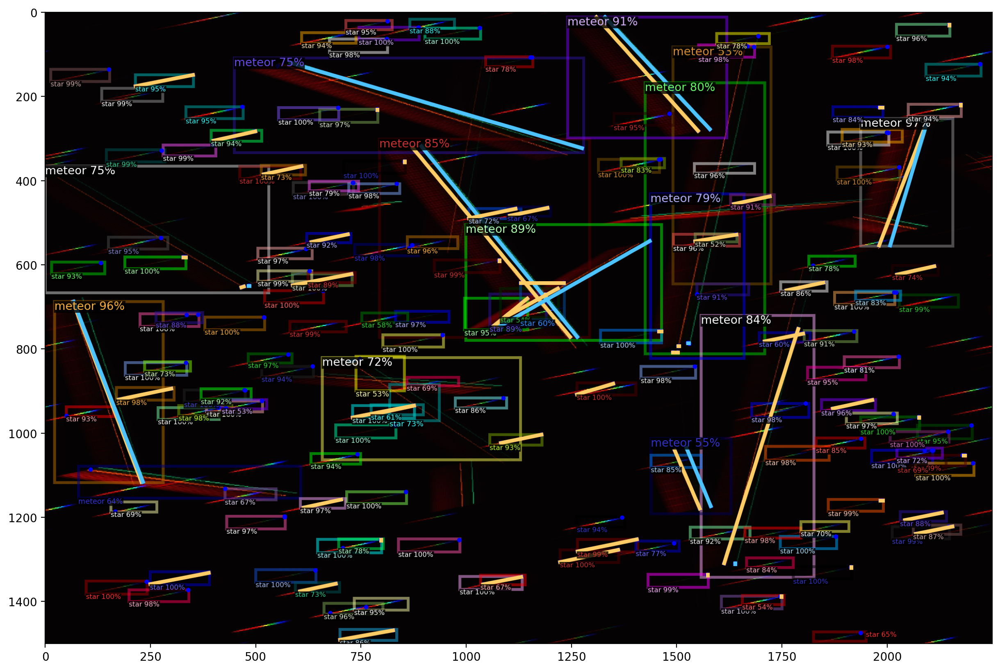

In [71]:
from detectron2.engine import DefaultPredictor

# cfg.merge_from_file(model_zoo.get_config_file("COCO-Keypoints/keypoint_rcnn_R_101_FPN_3x.yaml"))

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.1

cfg.MODEL.WEIGHTS = os.path.join(out_dir, 'model_final.pth')
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.TEST.KEYPOINT_OKS_SIGMAS = [1, 1, 1, 1]
predictor = DefaultPredictor(cfg)

for d in random.sample(dataset_dicts, 1):    
    im = plt.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:,:,::-1], metadata, scale=1.5)
    # print(outputs["instances"])
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize=[15, 10])
    plt.imshow(out.get_image()[:, :, ::-1])

[03/06 20:30:50 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...
(1000, 1500, 3) uint8
(1000, 1500, 3) uint8


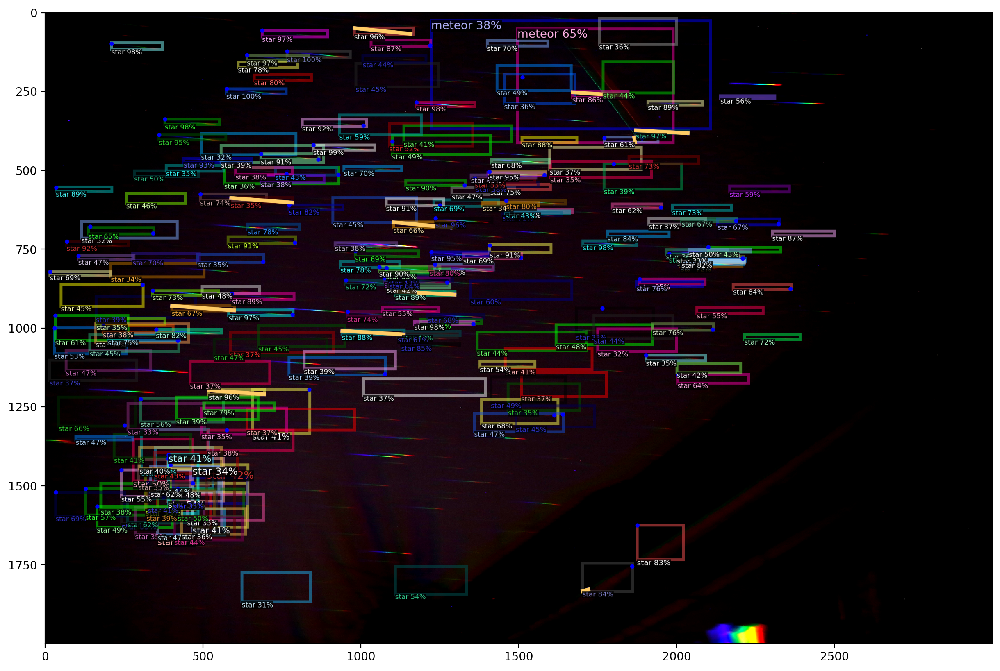

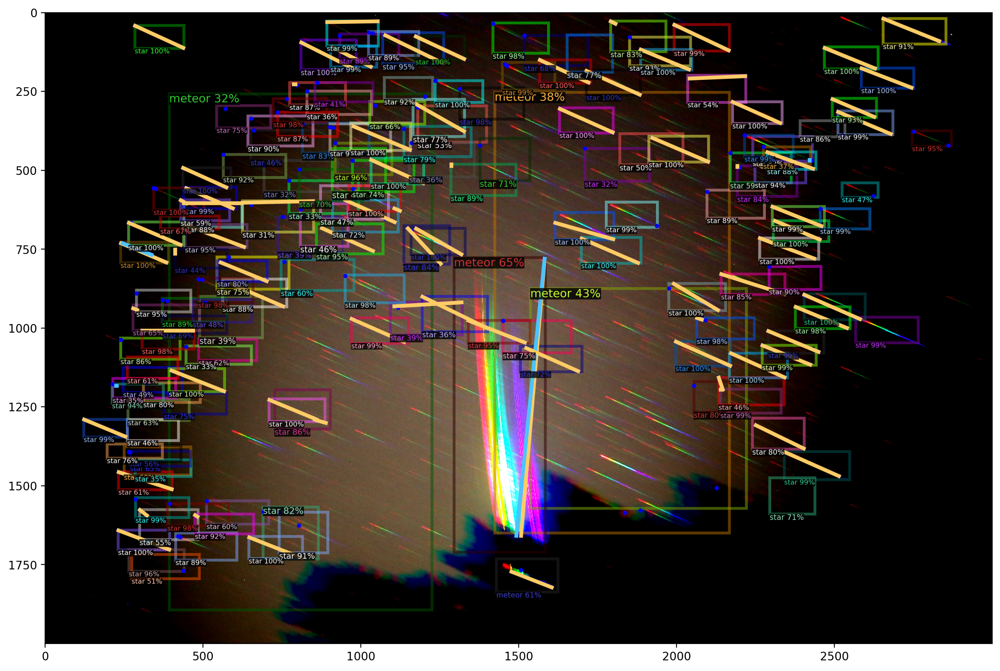

In [72]:
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.3
# del MetadataCatalog.get("fake_meteors").keypoint_names
# MetadataCatalog.get("fake_meteors").keypoint_names = ['1', '2', '3', '4']
predictor = DefaultPredictor(cfg)

for im in [plt.imread("testimg/testimg2.jpg"), plt.imread("testimg/testimg.jpg")]:
    im = cv2.resize(im, dsize=(1500, 1000), interpolation=cv2.INTER_CUBIC)
    im = im*2
    print(im.shape, im.dtype)
    outputs = predictor(im)
    v = Visualizer(im[:,:,::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=2)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize=[15, 10])
    plt.imshow(out.get_image()[:, :, ::-1])

In [ ]:
d = {'a':1}
d.update({})

In [70]:
importlib.reload(utils)

<module 'utils' from '/mnt/c/Users/Chisen/OneDrive - University of Illinois - Urbana/Research/Meteor spectrum/Metspec/utils.py'>

28.0 12.193444358318576
[[[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 ...

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]

 [[0 0 0]
  [0 0 0]
  [0 0 0]
  ...
  [0 0 0]
  [0 0 0]
  [0 0 0]]]


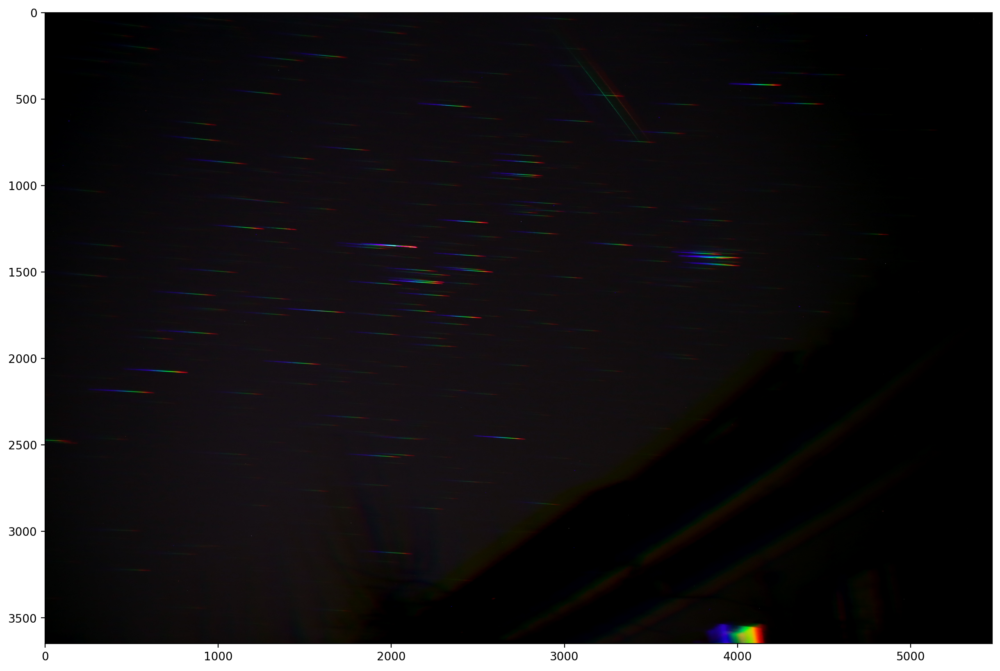

In [62]:
importlib.reload(utils)
im = plt.imread("testimg/testimg2.jpg")
im = utils.norm_linear(im)
plt.imshow(im)
print(im)